# Entraînement d'un réseau U-Net pour la segmentation de tumeurs dans des images 3D issues du dataset BraTS 2019

Le code présenté ci-dessous permet la création, l'entraînement et l'évaluation d'un modèle de réseau de neurones reprenant l'architecture U-Net pour la segmentation de tissus tumoraux.

## Introduction

Cette section détaille les entrées-sorties de ce programme, ainsi que la configuration recommandée et les librairies utilisées pour le faire fonctionner.

### Données d'entrée

Ce code fonctionne en conjonction avec le code de pré-traîtement des données de la base BraTS 2019 fourni. Il permet de travailler avec des données multimodales en empilant les données issues des acquisitions suivantes : 
-  Pondération T1 (T1)
-  Pondération T1 avec augmentation du contraste (T1CE)
-  Pondération T2 (T2)
-  Pondération T2 avec atténuation des fluides par inversion-récupération (FLAIR)

Se reporter à la [page de description du dataset BraTS 2019](https://www.med.upenn.edu/cbica/brats2019/data.html) pour plus d'informations

### Données de sortie

Le modèle permet de générer une segmentation en 5 classes qui sont : 
-  Extérieur du cerveau - (classe 0)
-  Tissu sain - (classe 1)
-  *Necrotic and non-enhancing tumor core* - (classe 2)
-  *Peritumoral edema* - (classe 3)
-  *GD-enhancing tumor* - (classe 4)

### Configuration

Ce code a été conçu et testé avec la configuration suivante : 
-  Python 3.10
-  CUDA Toolkit 11.2
-  CuDNN 8.1
-  Tensorflow 2.10
-  Pandas 1.5
-  Matplotlib 3.7
-  Scikit-learn 1.2

Il nécessite l'import des librairies et fonctions suivantes : 

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import csv
import tensorflow as tf
from sklearn.metrics import precision_recall_fscore_support
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv3D
from tensorflow.keras.layers import Conv3DTranspose
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.utils import to_categorical

## Création des datasets

Cette section détaille la façon dont sont organisés et construits les datasets d'entraînement et de validation.

### Organisation des datasets d'entraînement et de validation

Lors de la création des datasets, les images issues du pré-traîtement sont séparées en deux ensembles, l'un pour l'entraînement, l'autre pour la validation. Les images sont directement chargées depuis le dossier de sortie du pré-traîtement, et un fichier d'index au format .csv est créé, qui contient leur répartition au sein des deux ensembles. Un autre fichier .csv est créé, qui recense les paramètres de création de ces datasets.

### Paramètres de construction des datasets

Dans la cellule ci-dessous, il est possible de définir tous les paramètres de création des datasets : 
-  **reuse_dataset** : Variable booléenne indiquant si les fichiers d'index et de paramètres existants doivent être réutilisés. Si aucun fichier d'index correspondant aux paramètres d'entraînement n'est trouvé, ce fichier est créé. En cas de réutilisation, les paramètres *channels*, *image_axis*, *train_size* et *validation_ratio* sont écrasés et remplacés par ceux présents dans le fichier de paramètres.
-  **channels** : Liste des canaux IRM à inclure lors de l'entraînement.
-  **train_size** : Taille du dataset d'entraînement, en nombre d'images.
-  **validation_ratio** : Taille du dataset de validation, exprimé en proportion de la taille du dataset d'entraînement. *Par exemple, avec un ratio de 0.1 et un dataset d'entraînement de 100 images, le dataset de validation comportera 10 images*

Attention, s'il est indiqué que les ensembles d'entraînement et de validation doivent inclure plus d'images que n'en contient la base (335), ceux-ci seront redimensionnés en conservant leur ratio pour inclure toutes les images de la base.

In [2]:
# Paramètres de création des datasets

reuse_dataset = False
channels = ["flair","t1", "t1ce", "t2"]
train_size = 305
validation_ratio = 0.1

### Construction des fichiers d'index

La fonction ci-dessous se charge de créer les fichiers d'index permettant la construction des datasets. 

Le premier fichier d'index (appelé par la suite le *fichier de paramètres*) contient les paramètres de création des datasets suivants : 
-  **channels** : Canaux utilisés
-  **img_shape** : Dimensions des images sélectionnées
-  **train_size** : Taille du dataset d'entraînement
-  **validation_ratio** : Taille du dataset de validation

Le second fichier d'index (appelé par la suite le *fichier d'annuaire*) permet de garder la trace des images sélectionnées dans chaque subdivision des datasets. Il s'agit d'in fichier .csv avec les champs suivants, détaillés pour chaque image incluse dans les datasets : 
-  **file_name** : Chemin et nom du fichier .npz issu de la base pré-traîtée dont l'image est tirée
-  **train_or_test** : String pouvant valoir *'train'* ou *'test'* indiquant si l'image fait partie du dataset d'entraînement ou de validation

Ces fichiers d'index sont enregistrés dans un dossier nommé **./datasets/3d_{N}/** qui est créé s'il n'existe pas, où **{N}** est le nombre d'images incluses dans le dataset d'entraînement. Le fichier d'annuaire est nommé **index.csv**  et le fichier de paramètres est nommé **parameters.csv**. 

La variable d'entrée **path_to_data** est la liste des chemins vers les volumes 3D pré-traîtés d'où seront tirées les images à inclure dans les datasets, et la variable **dataset_path** est le chemin dans lequel le dataset est stocké.

In [3]:
def build_index(path_to_data, dataset_path, train_size, validation_ratio, channels, img_shape):
    
    os.makedirs(dataset_path, exist_ok=True)
    
    # Construction du fichier de paramètres
    param_file = open(os.path.join(dataset_path, 'parameters.csv'), mode='w')
    param_names = ['channels', 'img_shape', 'train_size', 'validation_ratio']
    writer_param = csv.DictWriter(param_file, fieldnames=param_names)
    writer_param.writeheader()
    dico_param = {'channels' : channels, 
                  'img_shape' : img_shape, 
                  'train_size' : train_size, 
                  'validation_ratio' : validation_ratio, 
                 }
    writer_param.writerow(dico_param)
    param_file.close()
    
    # Tirage aléatoire des images qui seront incluses dans les datasets
    rp = np.random.permutation(len(path_to_data))
    validation_size = int(train_size* validation_ratio)
    rp = rp[:(train_size + validation_size)]
    datasets = []
    for k in range(len(rp)):
        datasets.append(path_to_data[rp[k]])

    # Construction du fichier d'annuaire
    index_file = open(os.path.join(dataset_path, 'index.csv'), mode='w')
    field_names = ['file_name', 'train_or_test']
    writer = csv.DictWriter(index_file, fieldnames=field_names)
    writer.writeheader()
    
    dico = {'train_or_test' : 'train'}
    for i in range(train_size):
        dico['file_name'] = datasets[i]
        writer.writerow(dico)
        
    dico['train_or_test'] = 'test'
    for i in range(validation_size):
        dico['file_name'] = datasets[i + train_size]
        writer.writerow(dico)
        
    index_file.close()   
    
    return

### Lecture du fichier de paramètres

La fonction suivante se charge de récupérer les paramètres de création des datasets dans le fichier de paramètre. 

La variable d'entrée **dataset_path** contient le chemin vers le dossier dans lequel sont stockés les fichiers d'index.

Cette fonction renvoie les valeurs des variables **train_size** , **validation_ratio** , **channels** et **img_shape**.

In [4]:
def read_params_from_index(dataset_path):
    # Récupération des paramètres d'entraînement de l'index
    params = pd.read_csv(os.path.join(dataset_path, 'parameters.csv')).dropna()
    img_shape = params['img_shape'][0]
    channels = params['channels'][0]
    train_size = params['train_size'][0]
    validation_ratio = params['validation_ratio'][0]
    
    img_shape = img_shape[1:-1]
    img_shape = tuple(map(int, img_shape.split(', ')))
    
    channels = channels[1:-1]
    channels = list(map(str, channels.split(', ')))
    for k in range(len(channels)):
        channels[k] = channels[k][1:-1]
    
    return train_size, validation_ratio, channels, img_shape

### Séparation des datasets à partir du fichier d'index

La fonction ci-dessous se charge, à partir des fichiers d'index créés ou fournis, de construire deux liste de fichiers contenus dans le dossier **./preprocessed_data/**, qui correspondent respectivement aux listes d'images incluses dans le dataset d'entraînement et dans le dataset de validation.

Cette fonction prend en entrée la variable **dataset_path**, et renvoie les deux listes **train_dataset** et **test_dataset**.

In [5]:
def split_datasets(dataset_path): 
    index = pd.read_csv(os.path.join(dataset_path, 'index.csv')).dropna()
    train_dataset = index[index.train_or_test == 'train'].file_name.tolist()
    test_dataset = index[index.train_or_test == 'test'].file_name.tolist()
    return train_dataset, test_dataset

### Construction des datasets

Cette fonction se charge de construire ou récupérer les datasets pour l'entraînement.

Tout d'abord, on vérifie si la taille du dataset demandée est supérieure au nombre d'images présentes dans la base, auquel cas on recalcule la valeur de la variable **train_size** pour que toutes les images soient incluses dans le dataset en conservant la même valeur de **validation_ratio**.

Ensuite, si nécessaire, on construit les fichiers d'index. Pour cela : 
-  On récupère la liste des fichiers pré-traîtés présents dans le dossier **./preprocessed_data/** que l'on joint avec le chemin dudit dossier, et on stocke le tout dans la liste **path_to_data**.
-  On charge le premier fichier de cette liste pour mesurer la taille des images que l'on aura à traîter, stockée dans le tuple **img_shape**. Les 3 premiers champs de ce tuple contiennent les dimensions par canal de chaque image, le dernier champ contient le nombre de canaux utilisés pour l'apprentissage.
-  On vérifie que la taille du dataset demandée n'est pas supérieure au nombre d'images présentes dans la base
-  On lance la fonction de création des fichiers d'index

Après cela, on récupère les paramètres dans le fichier de paramètres, à l'aide de la fonction adéquate. Si ces paramètres sont différents de ceux entrés précédemments car extraits d'un fichier d'index pré-existant, ils les écrasent.

Enfin, on récupère dans les fichiers d'index les noms et chemins des fichiers de chaque ensemble à l'aide de la fonction de séparation des datasets.

Cette fonction prend en entrée les paramètres de création des datasets, et renvoie ces mêmes paramètres, mis à jour s'ils sont issus des fichiers d'index, ainsi que les listes **train_dataset** et **test_dataset** et le tuple de mesure des dimensions des images.

In [6]:
def build_datasets(train_size, validation_ratio, channels, reuse=False):
    
    # Vérification de la taille du dataset
    if train_size + int(np.floor(train_size * validation_ratio)) > 335 :
        train_size = 335 - int(np.floor(335*validation_ratio/(1+validation_ratio)))
    
    # Construction des fichiers d'index
    dataset_path = os.path.join('datasets', '3d_{0:d}'.format(train_size))
    if not(reuse & os.path.exists(os.path.join(dataset_path, 'index.csv')) & os.path.exists(os.path.join(dataset_path, 'index.csv'))) :
        
        # Récupération des chemins des données
        list_of_files = os.listdir('./preprocessed_data/')
        path_to_data = []
        for file in list_of_files:
            path_to_data.append(os.path.join('preprocessed_data', file))

        # Taille des images d'entrée   
        loaded = np.load(path_to_data[0])
        img = loaded['data']
        img_shape = (img.shape[0], img.shape[1], img.shape[2], len(channels))
        del img, loaded
        
        build_index(path_to_data, dataset_path, train_size, validation_ratio, channels, img_shape)
        rebuild = True
        
    # Lecture des paramètres inclus dans le fichier de paramètres
    train_size, validation_ratio, channels, img_shape = read_params_from_index(dataset_path)
    
    # Création des listes d'images de chaque ensemble
    train_dataset, test_dataset = split_datasets(dataset_path)
            
    return train_dataset, test_dataset, train_size, validation_ratio, channels, img_shape

Il suffit ensuite d'une ligne pour gérer entièrement la création des datasets :

In [7]:
train_dataset, test_dataset, train_size, validation_ratio, channels, img_shape = build_datasets(train_size, validation_ratio, channels, reuse=reuse_dataset)

## Création du modèle

Le réseau de neurones utilisé pour réaliser cette segmentation est basé sur l'architecture [U-Net](https://fr.wikipedia.org/wiki/U-Net). Cette architecture est particulièrement adaptée à la segmentation d'images. Ce modèle est composé de blocs de trois natures différentes :

### Bloc d'encodage

Ce bloc a pour tâche de compresser les données, en réduisant leur dimension spatiale mais en augmentant leur dimension sémantique. Il est composé de :
-  Une couche de convolution 3D comprenant un nombre de filtres grandissant avec la profondeur dans le réseau
-  Une couche de normalisation qui peut être shuntée
-  Une couche d'activation *Leaky ReLU*

In [8]:
def encoding_block(layer_in, n_filters, stride, apply_batchnorm=True):
    init = tf.random_normal_initializer(0., 0.02)
    g = Conv3D(n_filters, (stride+2,stride+2,stride+2), strides=(stride,stride,stride), padding='same', kernel_initializer=init)(layer_in)
    if apply_batchnorm:
        g = BatchNormalization()(g, training=True)
    g = LeakyReLU(alpha=0.2)(g)
    return g

### Goulot d'étranglement

Ce bloc traîte les données issues de la cascade d'encodage, sans en modifier la dimmensionnalité. Il est composé de trois couches de convolution 3D suivies chacune d'une couche d'activation ReLU

In [9]:
def bottleneck(layer_in, n_filters):
    init = tf.random_normal_initializer(0., 0.02, 0)
    # bottleneck, no batch norm and relu
    b1 = Conv3D(512, (3,3,3), strides=(1,1,1), padding='same', kernel_initializer=init)(layer_in)
    b1 = Activation('relu')(b1)
    b2 = Conv3D(512, (3,3,3), strides=(1,1,1), padding='same', kernel_initializer=init)(b1)
    b2 = Activation('relu')(b2)
    b3 = Conv3D(512, (3,3,3), strides=(1,1,1), padding='same', kernel_initializer=init)(b2)
    b3 = Activation('relu')(b2)
    return b3

### Bloc de décodage

Ce bloc a pour tâche de décompresser les données issues de la couche précédente et de les mettre en relation avec les données sorties du bloc d'encodage de même dimmensionnalité, avant le goulot d'étranglement. Il est composé de :
-  Une couche de déconvolution 3D dont le nombre de filtres diminue avec la profondeur du réseau
-  Une couche de normalisation
-  Une couche de *dropout*
-  Une couche de concaténation des données d'agrégation avec les données issues du bloc d'encodage
-  Une couche d'activation *ReLU*

In [10]:
def decoding_block(layer_in, skip_in, n_filters, stride, dropout=True):
    init = tf.random_normal_initializer(0., 0.02)
    g = Conv3DTranspose(n_filters, (stride+2,stride+2,stride+2), strides=(stride,stride,stride), padding='same', kernel_initializer=init)(layer_in)
    g = BatchNormalization()(g, training=True)
    if dropout:
        g = Dropout(0.2)(g, training=True)
    g = Concatenate()([g, skip_in])
    g = Activation('relu')(g)
    return g

### Réseau complet

Le réseau s'architecture de la façon suivante : 
-  Une étape d'encodage constituée de 5 blocs d'encodage successifs, divisant chacun la taille des images par 2 ou 3 et augmentant la profondeur du tenseur de données à chaque couche, permettant d'atteindre une profondeur de 512 canaux
-  Un goulot d'étranglement
-  Une étape de décodage constituée de 5 blocs de décodage réduisant la profondeur du tenseur de données jusqu'à 64 canaux
-  Une dernière couche de déconvolution suivie du'une couche d'activation *softmax* permettant d'effectuer la classification

In [11]:
def build_unet(image_shape):
    
    init = tf.random_normal_initializer(0., 0.02)
    inputs = Input(shape=image_shape)
    
    # Encodage
    e1 = encoding_block(inputs, 32, 3, apply_batchnorm=False) # Taille de sortie : (80x80x48x32)
    e2 = encoding_block(e1, 64, 2)                            # Taille de sortie : (40x40x24x64)
    e3 = encoding_block(e2, 128, 2)                           # Taille de sortie : (20x20x12x128)
    e4 = encoding_block(e3, 256, 2)                           # Taille de sortie : (10x10x6x256)
    e5 = encoding_block(e4, 512, 2)                           # Taille de sortie : (5x5x3x512)
    
    # Goulot d'étranglement
    b = bottleneck(e5, 512)
    
    # Décodage
    d1 = decoding_block(b, e5, 512, 1)
    d2 = decoding_block(d1, e4, 512, 2)
    d3 = decoding_block(d2, e3, 256, 2, dropout=False)
    d4 = decoding_block(d3, e2, 128, 2, dropout=False)
    d5 = decoding_block(d4, e1, 64, 2, dropout=False)
    
    # Sortie
    g = Conv3DTranspose(5, (5,5,5), strides=(3,3,3), padding='same', kernel_initializer=init)(d5)
    output = Activation('softmax')(g)
    
    # Construction du modèle
    model = Model(inputs, output)
    return model

### Construction du modèle

Le morceau de code suivant permet le chargement ou la construction du modèle. 

Si la variable booléenne **load_model** est à ***True***, le programme cherche s'il existe un modèle pré-existant et si oui il le charge. Ce modèle doit être situé dans le dossier **./models/**, et nommé **Model_3d_{N}.hdf5**, où **{N}** est le nombre d'images incluses dans le dataset d'entraînement.

Si ce modèle n'existe pas, ou si **load_model** est à ***False***, le programme le crée et le compile en utilisant l'optimiseur *Adam* avec un taux d'apprentissage à 2e-4. Si un modèle avec ce nom existait précédemment, il est écrasé.

La fonction de coût (*Loss*) est une entropie binaire croisée, idéale pour les tâches de classification.

Enfin, on affiche le résumé de l'archtecture du modèle.

In [12]:
load_model = False
if load_model & os.path.exists(os.path.join('models', 'Model_3d_{0:d}.hdf5'.format(train_size))):
    unet_model = tf.keras.models.load_model(os.path.join('models', 'Model_3d_{0:d}.hdf5'.format(train_size)))
else :
    os.makedirs('models', exist_ok=True)
    unet_model = build_unet(img_shape)
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    unet_model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=False), optimizer=opt, loss_weights=[0.5])
    tf.keras.models.save_model(unet_model, os.path.join('models', 'Model_3d_{0:d}.hdf5'.format(train_size)))

unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 240, 240, 1  0           []                               
                                44, 4)]                                                           
                                                                                                  
 conv3d (Conv3D)                (None, 80, 80, 48,   16032       ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 80, 80, 48,   0           ['conv3d[0][0]']                 
                                32)                                                           

## Mesure des performances du modèle

Cette section détaille la façon dont le performances du réseau sont mesurées et visualisées

### Visualisation des résultats

Cette fonction se charge d'afficher les résultats du réseau, en affichant côte-à-côte les données d'entrée, la carte de segmentation issue du dataset et la carte de segmentation générée par le réseau de neurones. Elle affiche plusieurs tranches d'un même cas suivant l'axe Z.

Chaque ligne de la sortie correspond à une hauteur différente. Les données d'entrée sont affichées dans l'ordre de la liste **channels**, suivie de la carte de segmentation originale, et enfin la carte de prédiction. Le nombre de ligne à afficher est donné par variable d'entrée **n_sample**. Les hauteurs de coupe sont réparties régulièrement le long du volume de données.

Cette fonction prend en entrée les cartes de données **data**, la carte de segmentation prédite **pred**, la carte de segmentation originale **seg** et le nombre de tranches à afficher **n_sample**.

In [13]:
def visualize(data, pred, seg, n_sample=10):
    n_img_per_line = 2 + data.shape[4]
    plt.figure(figsize=(5*n_img_per_line, 5*n_sample))
    for i in range(n_sample):
        height = ((i+1)*data.shape[3])//(n_sample+1)
        # Données
        for j in range(data.shape[4]):
            plt.subplot(n_sample, n_img_per_line, n_img_per_line * i + j + 1)
            plt.xticks([])
            plt.yticks([])
            plt.grid(False)
            plt.imshow(data[0,:,:,height,j], vmin=-1, vmax=1)
        
        # Carte de segmentation
        plt.subplot(n_sample, n_img_per_line, n_img_per_line * (i + 1) - 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(seg[:,:,height], vmin=0, vmax=4)
        
        # Carte de prédiction
        plt.subplot(n_sample, n_img_per_line, n_img_per_line * (i + 1))
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(pred[0,:,:,height], vmin=0, vmax=4)
        
    plt.show()
    return   

### Mesure des performances

Cette fonction calcule et affiche les performances du modèle sur un dataset. Pour cela, on calcule la précision, la sensibilité et le score F1 pour chaque image du dataset et pour chaque classe.

Ces grandeurs sont définies de la façons suivante (pour l'image $i$ et la classe $k$): 
-  Sensibilité : $S_{ik} = \frac{TP}{TP + FP}$
-  Précision : $P_{ik} = \frac{TP}{TP + FP}$
-  Score F1 : $F1_{ik} = \frac{2.S.P}{S+P}$

avec 
-  $TP$ le nombre de vrais positifs (nombre de voxels de l'image $i$ correctement classifiés dans la classe $k$)
-  $FP$ le nombre de faux positifs (nombre de voxels de l'image $i$ classifiés dans la classe $k$ mais appartenant à une autre classe)
-  $FN$ le nombre de faux négatifs (nombre de voxels de l'image $i$ appartenant à la classe $k$ mais classifiés dans une autre classe)

On agrège ensuite les résultats en effectuant une moyenne pondérée par classe sur les images. En notant $N_{ik}$ le nombre de voxels de l'image $i$ appartenant à la classe $k$ et $X_k$ le score pour la classe $k$ pour lequel on agrège les résultats des $X_{ik}$, on a :
\begin{equation} 
\mathbb{E}[X_k] = \dfrac{\sum_i N_{ik}.X_{ik}}{\sum_i N_{ik}}
\end{equation}
Et :
\begin{equation} 
\sigma[X_k] = \sqrt{\dfrac{\sum_i N_{ik}^2.X_{ik}^2}{\sum_i N_{ik}^2} - \mathbb{E}[X_k]^2}
\end{equation}

On affiche les résultats sous la forme $\mathbb{E}[X_k] \pm \sigma[X_k]$

On calcule ensuite les scores globaux en agrégeant sur les classes. En notant $X$ le score global d'une image, on a :
\begin{equation} 
\mathbb{E}[X] = \frac{\sum_k \sum_i N_{ik}.X_{ik}}{\sum_k \sum_i N_{ik}}
\end{equation}
Et : 
\begin{equation} 
\sigma[X] = \sqrt{\frac{\sum_k \sum_i N_{ik}^2.X_{ik}^2}{\sum_k \sum_i N_{ik}^2} - \mathbb{E}[X]^2}
\end{equation}

En plus de cela, on calcule également les précision, sensibilité et score F1 binaires, mesurent si chaque voxel a correctement été catégorisé comme tumoral, sans se soucier de quel type de tissu tumoral il s'agit.

Pour finir, si la variable booléenne d'entrée **show** est à ***True***, on appelle la fonction de visualisation pour afficher la dernière image traîtée par le réseau.

Cette fonction prend en entrée le modèle **unet_model**, la liste **dataset** des noms des fichiers du dataset à mesurer et la variable **show**.

Elle renvoie les moyennes et écarts-types des scores par classe, globaux et binaires.

In [14]:
def measure_performance(unet_model, dataset, show=False):
    
    scores_weighted_sum = np.zeros((4,5), dtype='float64')
    scores_weighted_squares = np.zeros((4,5), dtype='float64')
    class_scores = np.zeros((4,2,5), dtype='float64')
    global_scores = np.zeros((4,2), dtype='float64')
    binary_scores = np.zeros((4,2), dtype='float64')
    
    for i in range(len(dataset)):
        loaded = np.load(dataset[i])
        data = np.expand_dims(loaded['data'], axis=0)
        seg = loaded['seg']
        del loaded

        pred = np.argmax(unet_model.predict(data, verbose=0), axis=4)
        precision, recall, F1, support = precision_recall_fscore_support(seg.flatten(), pred.flatten(), labels=np.asarray([0, 1, 2, 3, 4]), zero_division=0)

        results = (np.concatenate((precision.reshape((1,5)), recall.reshape((1,5)), F1.reshape((1,5)), np.ones((1,5))), axis=0) * np.dot(np.ones((4,1)), support.reshape((1,5)))).reshape((4,1,5))
        class_scores += np.concatenate((results, results**2), axis=1)

        precision, recall, F1, support = precision_recall_fscore_support((seg.flatten() >= 2).astype(int), (pred.flatten() >= 2).astype(int), labels=[1], zero_division=0)
        results = np.asarray([precision, recall, F1, [1]]) * support
        binary_scores += np.concatenate((results, results ** 2), axis=1)
                
    global_scores = class_scores.sum(axis=2)
    
    for k in range(5):
        class_scores[:3,:,k] /= np.dot(np.ones((3,1)), class_scores[3,:,k].reshape((1,2)))
        class_scores[:3,1,k] = np.sqrt(np.abs(class_scores[:3,1,k] - class_scores[:3,0,k]**2))
        print("Performances pour la classe {0:d} ({1:d} voxels) : Précision {2:.3f}% \u00B1 {3:.3f}% - Sensibilité {4:.3f}% \u00B1 {5:.3f}% - F1 {6:.3f}% \u00B1 {7:.3f}%"
              .format(k, int(class_scores[3,0,k]), class_scores[0,0,k]*100, class_scores[0,1,k]*100, class_scores[1,0,k]*100, class_scores[1,1,k]*100, class_scores[2,0,k]*100, class_scores[2,1,k]*100))    
    
    global_scores[:3,:] /= np.dot(np.ones((3,1)), global_scores[3,:].reshape((1,2)))
    global_scores[:3,1] = np.sqrt(np.abs(global_scores[:3,1] - global_scores[:3,0]**2))
    print("Performances globales ({0:d} voxels) : Précision {1:.3f}% \u00B1 {2:.3f}% - Sensibilité {3:.3f}% \u00B1 {4:.3f}% - F1 {5:.3f}% \u00B1 {6:.3f}%"
          .format(int(global_scores[3,0]), global_scores[0,0]*100, global_scores[0,1]*100, global_scores[1,0]*100, global_scores[1,1]*100, global_scores[2,0]*100, global_scores[2,1]*100))
    
    binary_scores[:3,:] /= np.dot(np.ones((3,1)), binary_scores[3,:].reshape((1,2)))
    binary_scores[:3,1] = np.sqrt(np.abs(binary_scores[:3,1] - binary_scores[:3,0]**2))
    
    print("Performances binaires ({0:d} voxels) : Précision {1:.3f}% \u00B1 {2:.3f}% - Sensibilité {3:.3f}% \u00B1 {4:.3f}% - F1 {5:.3f}% \u00B1 {6:.3f}%"
          .format(int(binary_scores[3,0]), binary_scores[0,0]*100, binary_scores[0,1]*100, binary_scores[1,0]*100, binary_scores[1,1]*100, binary_scores[2,0]*100, binary_scores[2,1]*100))
    
    if show :
        visualize(data, pred, seg, n_sample=10)
    
    return class_scores, global_scores, binary_scores

## Entraînement du modèle

Ici on détaille comment se déroule l'entraînement du modèle.

### Construction des batchs

Lors de l'entraînement, les données sont passées par batchs dans le réseau. La fonction ci-desous se charge de construire ces batchs en empilant les images.

Elle prend en entrée la liste **paths** des chemins des images à inclure dans le batch, la taille des images **img_shape**, et la liste des canaux IRM à inclure **channels**.

Elle renvoie les deux tensurs **batch_data** et **batch_seg**.

In [15]:
def build_batch(paths, img_shape, channels):
    channel_order = {"flair" : 0, "t1" : 1, "t1ce" : 2, "t2" : 3}
    batch_data = np.zeros((len(paths), img_shape[0], img_shape[1], img_shape[2], img_shape[3]))
    batch_seg = np.zeros((len(paths), img_shape[0], img_shape[1], img_shape[2], 5))

    for i in range(len(paths)):
        loaded = np.load(paths[i])        
        data = loaded['data']
        for j in range(len(channels)):
            batch_data[i,:,:,:,j] = data[:,:,:,channel_order[channels[j]]]

        batch_seg[i,:,:,:,:] = to_categorical(loaded['seg'], num_classes=5)

    return batch_data, batch_seg

### Fonction d'entraînement

Cette fonction gère l'organisation de l'entraînement.

A chaque époque, mélange le dataset puis on divise en batchs. Ce mélange permet de s'assurer de ne pas passer systématiquement les mêmes données dans le même ordre, ce qui dégraderait la qualité de l'entraînement. Le réseau est ensuite entraîné batch par batch.

Après chaque époque, le modèle est sauvegardé, et on affiche la valeur moyenne de la fonction de coût sur l'ensemble des batchs, ainsi que des informations concernant l'avancement, le temps écoulé depuis le début de l'entraînement, le temps restant, et la valeur moyenne de la fonction de coût sur l'époque.

Enfin, toutes les 5 époques, on mesure les performances du réseau sur le dataset de validation, et on en profite pour visualiser un cas de ce dataset.

Cette fonction prend en entrée le modèle **unet_model**, les listes **train_dataset** et **test_dataset** des noms des datasets d'entraînement et de validation, la taille totale du dataset d'entraînement **train_size**, le nombre d'époques d'entraînement **n_epochs** (optionnel, 20 par défaut) et la taille des batchs **batch_size** (optionnel, 3 par défaut).

In [16]:
def train(unet_model, train_dataset, test_dataset, channels, img_shape, n_epochs=20, batch_size=3):

    n_batch = int(np.floor(len(train_dataset)/batch_size))
    start_time = time.time()
    for epoch in range(n_epochs):
        batch_losses = np.zeros(int(np.floor(len(train_dataset)/batch_size)))
        rp = np.random.permutation(len(train_dataset))
        for i in range(n_batch): 
            batch_paths = []
            for j in range(batch_size):
                batch_paths.append(train_dataset[rp[i*batch_size+j]])
                
            batch_data, batch_seg = build_batch(batch_paths, img_shape, channels)
            batch_losses[i] = unet_model.train_on_batch(batch_data, batch_seg)            
        
        tf.keras.models.save_model(unet_model, os.path.join('models', 'Model_3d_{0:d}.hdf5'.format(train_size)))
        
        if (epoch+1)%5 ==0:
            print("Evaluation des performances")
            class_scores, global_scores, binary_scores = measure_performance(unet_model, test_dataset, show=True)
            
            
        stop_time = time.time()
        avancement = (epoch+1)/(n_epochs)
        duree = stop_time - start_time
        duree_totale = duree / avancement
        ETA = duree_totale - duree
        print("Avancement : {0:.2f}%, Temps écoulé : {1:d}h {2:02d}m {3:02d}s, Temps restant estimé: {4:d}h {5:02d}m {6:02d}s, Loss = {7:.6f}"
              .format(round(100*avancement,2), int(duree)//3600, (int(duree)//60)%60, int(duree)%60, int(ETA)//3600, (int(ETA)//60)%60, int(ETA)%60, np.mean(batch_losses)))

Avancement : 5.00%, Temps écoulé : 0h 43m 02s, Temps restant estimé: 13h 37m 43s, Loss = 0.094226
Avancement : 10.00%, Temps écoulé : 1h 20m 33s, Temps restant estimé: 12h 04m 58s, Loss = 0.017743
Avancement : 15.00%, Temps écoulé : 1h 58m 02s, Temps restant estimé: 11h 08m 52s, Loss = 0.012069
Avancement : 20.00%, Temps écoulé : 2h 35m 33s, Temps restant estimé: 10h 22m 15s, Loss = 0.009935
Evaluation des performances
Performances pour la classe 0 (199823951 voxels) : Précision 99.399% ± 1.003% - Sensibilité 99.463% ± 0.464% - F1 99.429% ± 0.455%
Performances pour la classe 1 (45945449 voxels) : Précision 96.003% ± 8.520% - Sensibilité 97.090% ± 4.538% - F1 96.513% ± 6.792%
Performances pour la classe 2 (664975 voxels) : Précision 51.312% ± 36.119% - Sensibilité 2.883% ± 4.560% - F1 5.017% ± 7.473%
Performances pour la classe 3 (1858082 voxels) : Précision 60.040% ± 23.816% - Sensibilité 69.429% ± 25.002% - F1 62.558% ± 24.356%
Performances pour la classe 4 (539543 voxels) : Précision

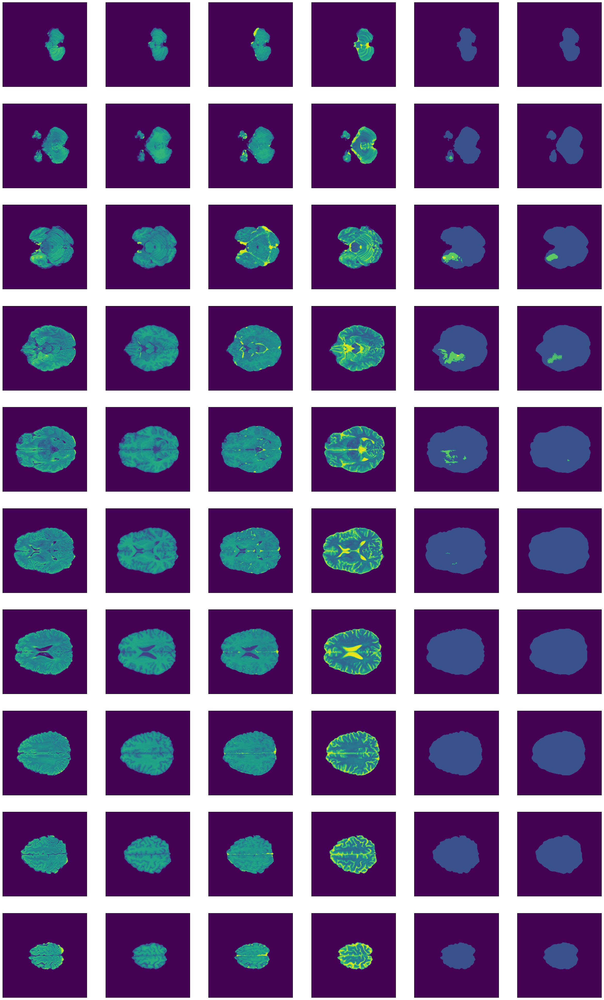

Avancement : 25.00%, Temps écoulé : 3h 17m 43s, Temps restant estimé: 9h 53m 11s, Loss = 0.008784
Avancement : 30.00%, Temps écoulé : 3h 55m 05s, Temps restant estimé: 9h 08m 31s, Loss = 0.008058
Avancement : 35.00%, Temps écoulé : 4h 32m 35s, Temps restant estimé: 8h 26m 14s, Loss = 0.007576
Avancement : 40.00%, Temps écoulé : 5h 09m 59s, Temps restant estimé: 7h 44m 59s, Loss = 0.007221
Avancement : 45.00%, Temps écoulé : 5h 47m 23s, Temps restant estimé: 7h 04m 35s, Loss = 0.006893
Evaluation des performances
Performances pour la classe 0 (199823951 voxels) : Précision 99.530% ± 0.760% - Sensibilité 99.505% ± 0.688% - F1 99.516% ± 0.269%
Performances pour la classe 1 (45945449 voxels) : Précision 96.643% ± 7.735% - Sensibilité 97.513% ± 4.486% - F1 97.054% ± 6.269%
Performances pour la classe 2 (664975 voxels) : Précision 61.157% ± 42.972% - Sensibilité 10.402% ± 11.848% - F1 16.141% ± 17.013%
Performances pour la classe 3 (1858082 voxels) : Précision 62.769% ± 25.286% - Sensibilité

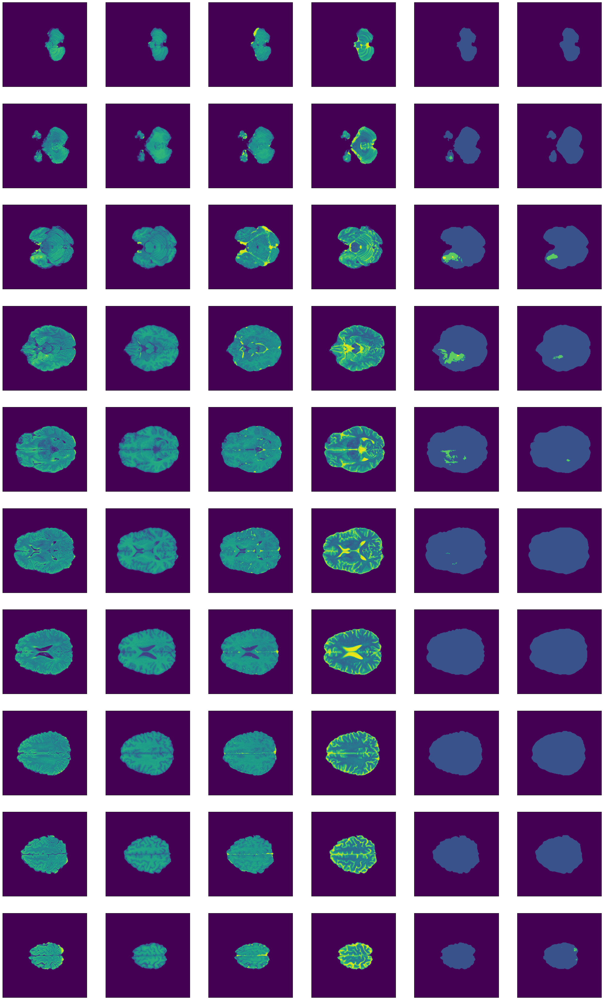

Avancement : 50.00%, Temps écoulé : 6h 29m 16s, Temps restant estimé: 6h 29m 16s, Loss = 0.006552
Avancement : 55.00%, Temps écoulé : 7h 06m 38s, Temps restant estimé: 5h 49m 03s, Loss = 0.006239
Avancement : 60.00%, Temps écoulé : 7h 43m 59s, Temps restant estimé: 5h 09m 19s, Loss = 0.005948
Avancement : 65.00%, Temps écoulé : 8h 21m 42s, Temps restant estimé: 4h 30m 08s, Loss = 0.005693
Avancement : 70.00%, Temps écoulé : 8h 59m 17s, Temps restant estimé: 3h 51m 07s, Loss = 0.005519
Evaluation des performances
Performances pour la classe 0 (199823951 voxels) : Précision 99.512% ± 0.679% - Sensibilité 99.567% ± 0.602% - F1 99.539% ± 0.216%
Performances pour la classe 1 (45945449 voxels) : Précision 97.317% ± 7.506% - Sensibilité 97.169% ± 4.781% - F1 97.225% ± 6.229%
Performances pour la classe 2 (664975 voxels) : Précision 55.685% ± 41.572% - Sensibilité 36.463% ± 27.496% - F1 42.116% ± 33.575%
Performances pour la classe 3 (1858082 voxels) : Précision 71.873% ± 27.183% - Sensibilité

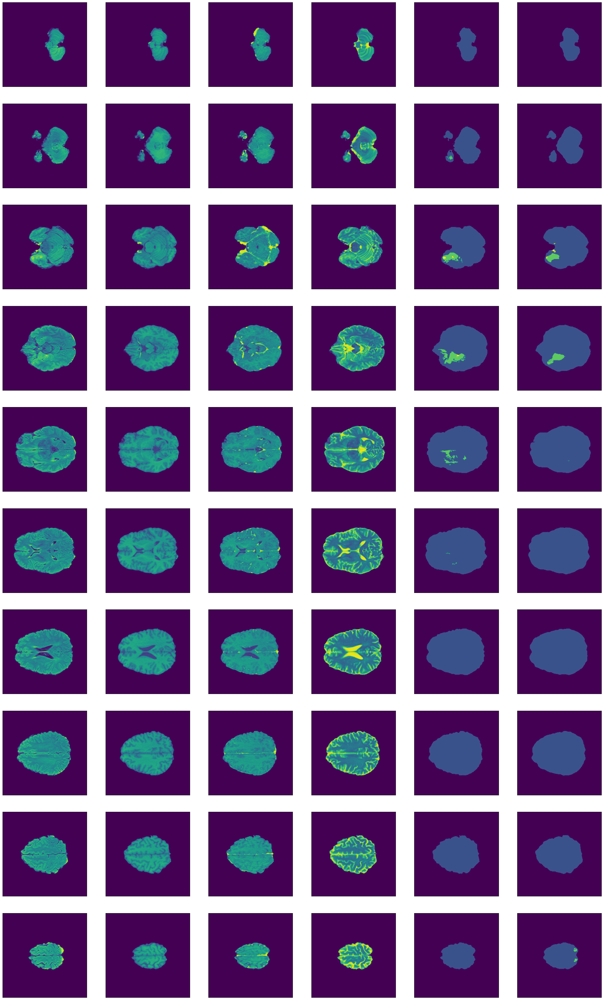

Avancement : 75.00%, Temps écoulé : 9h 42m 09s, Temps restant estimé: 3h 14m 03s, Loss = 0.005345
Avancement : 80.00%, Temps écoulé : 10h 19m 47s, Temps restant estimé: 2h 34m 56s, Loss = 0.005138
Avancement : 85.00%, Temps écoulé : 10h 57m 33s, Temps restant estimé: 1h 56m 02s, Loss = 0.004977
Avancement : 90.00%, Temps écoulé : 11h 35m 05s, Temps restant estimé: 1h 17m 13s, Loss = 0.004801
Avancement : 95.00%, Temps écoulé : 12h 12m 52s, Temps restant estimé: 0h 38m 34s, Loss = 0.004592
Evaluation des performances
Performances pour la classe 0 (199823951 voxels) : Précision 99.502% ± 0.713% - Sensibilité 99.590% ± 0.660% - F1 99.545% ± 0.242%
Performances pour la classe 1 (45945449 voxels) : Précision 97.288% ± 7.560% - Sensibilité 97.339% ± 4.624% - F1 97.296% ± 6.206%
Performances pour la classe 2 (664975 voxels) : Précision 54.533% ± 36.527% - Sensibilité 35.447% ± 18.433% - F1 39.283% ± 23.127%
Performances pour la classe 3 (1858082 voxels) : Précision 75.020% ± 23.734% - Sensibi

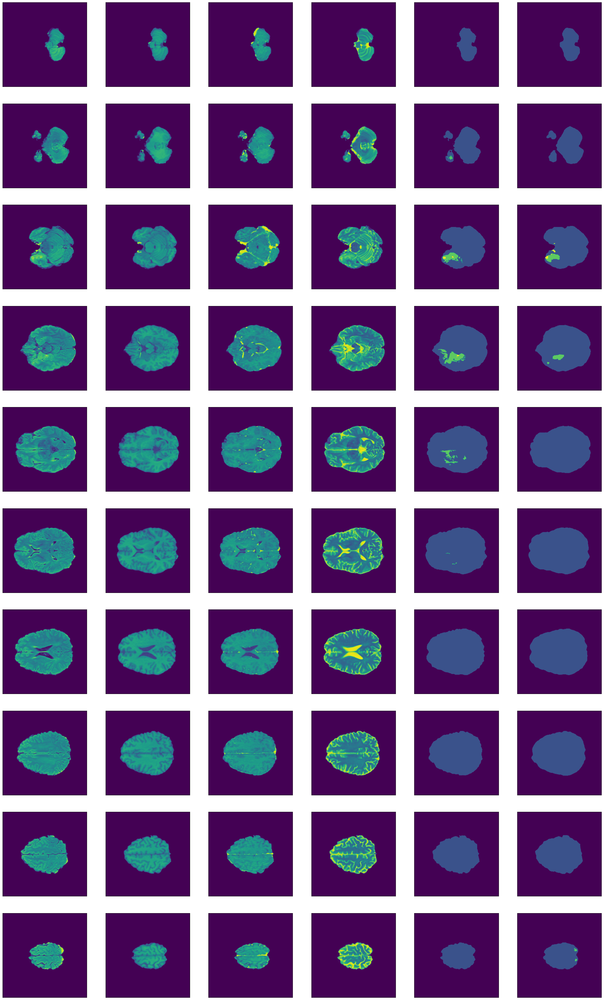

Avancement : 100.00%, Temps écoulé : 12h 55m 07s, Temps restant estimé: 0h 00m 00s, Loss = 0.004470


In [17]:
batch_size = 3
n_epochs = 20

train(unet_model, train_dataset, test_dataset, channels, img_shape, n_epochs=n_epochs, batch_size=batch_size)

Performances pour la classe 0 (199823951 voxels) : Précision 99.502% ± 0.715% - Sensibilité 99.590% ± 0.655% - F1 99.545% ± 0.238%
Performances pour la classe 1 (45945449 voxels) : Précision 97.290% ± 7.587% - Sensibilité 97.342% ± 4.587% - F1 97.298% ± 6.209%
Performances pour la classe 2 (664975 voxels) : Précision 54.416% ± 36.714% - Sensibilité 35.162% ± 18.859% - F1 39.052% ± 23.375%
Performances pour la classe 3 (1858082 voxels) : Précision 75.011% ± 24.308% - Sensibilité 66.774% ± 25.346% - F1 68.170% ± 21.935%
Performances pour la classe 4 (539543 voxels) : Précision 80.310% ± 26.814% - Sensibilité 70.712% ± 28.344% - F1 73.880% ± 28.892%
Performances globales (248832000 voxels) : Précision 98.749% ± 11.404% - Sensibilité 98.695% ± 12.440% - F1 98.678% ± 12.262%
Performances binaires (3062600 voxels) : Précision 91.901% ± 24.280% - Sensibilité 82.985% ± 23.136% - F1 86.385% ± 24.443%


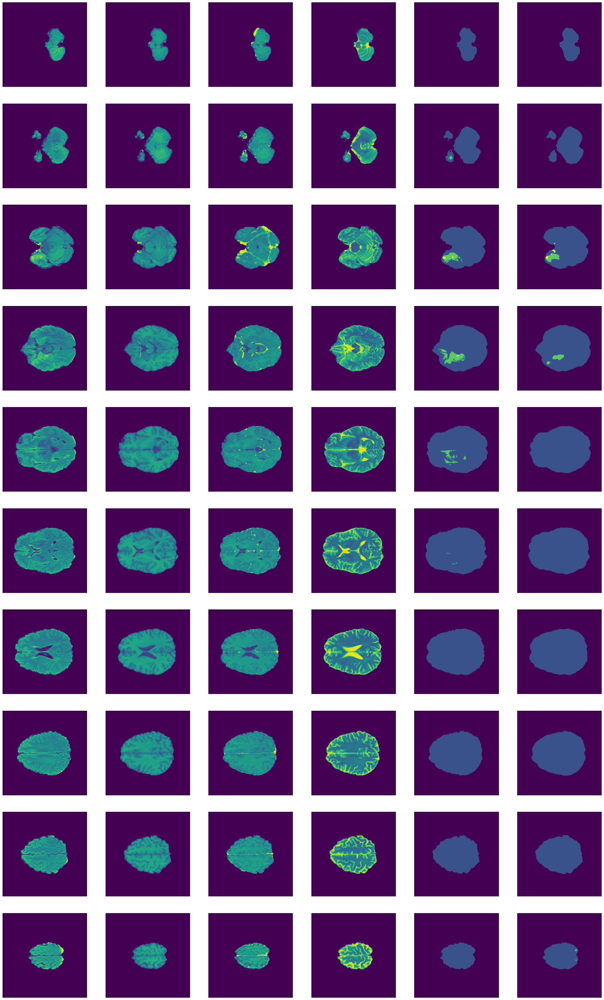

In [18]:
class_scores, global_scores, binary_scores = measure_performance(unet_model, test_dataset, show=True)